# Методы прогнозирования стационарных временных рядов <a class="tocSkip">

In [ ]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

warnings.filterwarnings("ignore")
from itertools import product

import statsmodels.api as sm
from scipy import stats
from sktime.utils.plotting import plot_correlations
from statsmodels.graphics import tsaplots

In [ ]:
params = {'lines.linewidth': 1.5,
          'lines.solid_capstyle': 'butt',
          'axes.labelsize': 'medium',
          'axes.axisbelow': True,
          'axes.grid': True,
          'axes.linewidth': 1.5,
          'axes.titlesize': 'medium',
          'grid.linestyle': '-',
          'grid.linewidth': 0.5,
          'xtick.major.size': 0,
          'xtick.minor.size': 0,
          'ytick.major.size': 0,
          'ytick.minor.size': 0,
          'figure.subplot.left': 0.08,
          'figure.subplot.right': 0.95,
          'figure.subplot.bottom': 0.07,
          'figure.figsize': (8, 4),
          'figure.autolayout': True,
          'figure.dpi': 300,
          'font.size': 14.0 }
plt.rcParams.update(params)

In [5]:
pd.options.display.max_rows = 999
%cd ../

/home/den/dev/git/time-series-analysis


# Статистические свойства моделей AR и MA

Здесь мы убедимся в наличии у моделей AR и MA тех свойств, которые обсуждали в лекции

## AR 1

Рассмотрим AR 1 с коэффициентом 0.9

In [ ]:
ar1_model = sm.tsa.ArmaProcess(ar=[1, -0.9,],nobs=1000)
ar1_ts = pd.Series(ar1_model.generate_sample(burnin=10000))

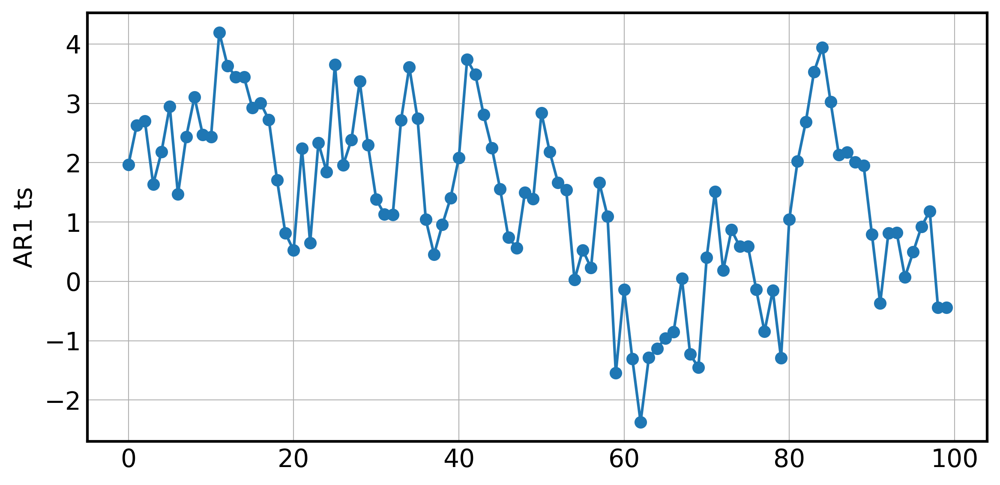

In [ ]:
ax = ar1_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

Стационарность и обратимость

In [ ]:
ar1_model.isinvertible,ar1_model.isstationary

(True, True)

In [ ]:
ar1_ts.mean(),ar1_ts.std()

(1.3942420293387594, 1.4650883991257455)

АКФ AR(1) экспоненциально убывает, ЧАКФ обнуляется после первого лага

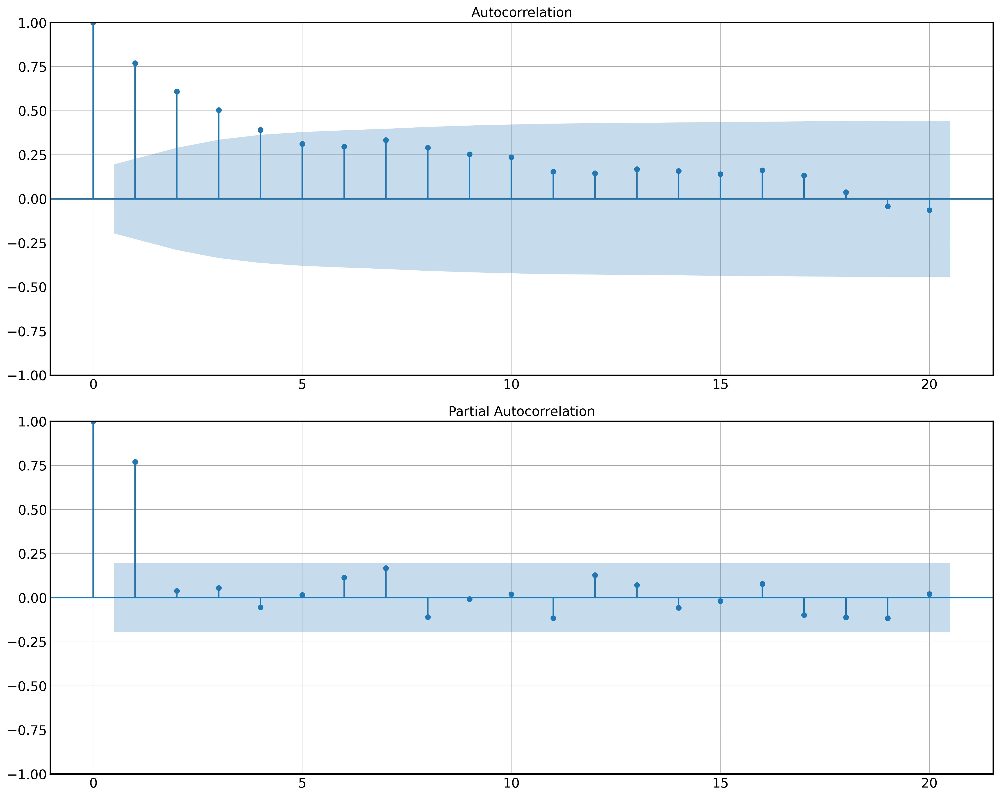

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ar1_ts,ax=ax[0]);
tsaplots.plot_pacf(ar1_ts,ax=ax[1]);

Рассмотрим AR 1 с коэффициентом -0.9

In [ ]:
ar1_model = sm.tsa.ArmaProcess(ar=[1, 0.9,],nobs=1000)
ar1_ts = pd.Series(ar1_model.generate_sample())

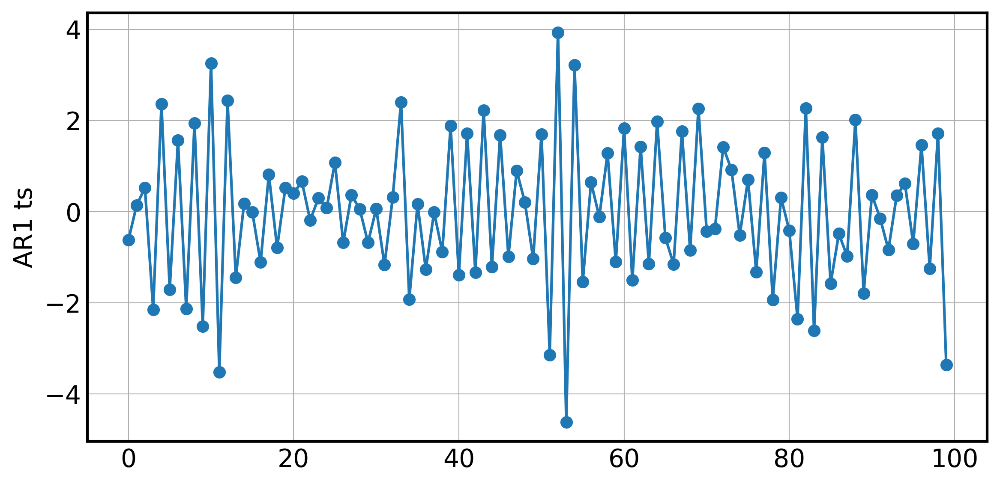

In [ ]:
ax = ar1_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

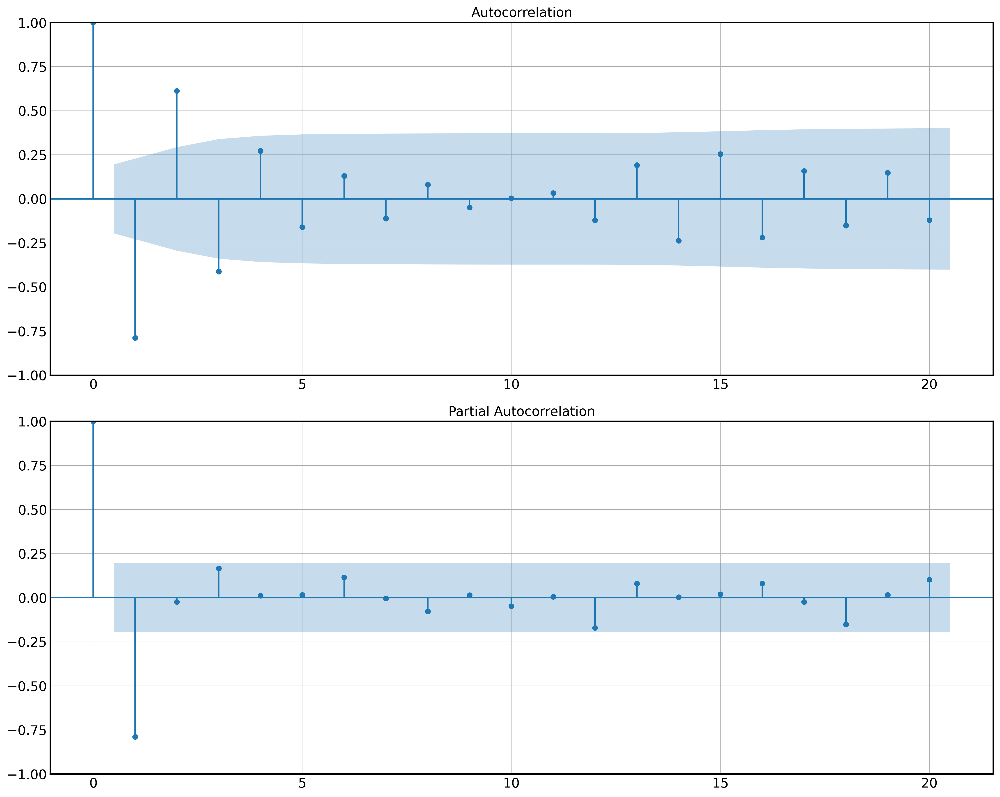

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ar1_ts,ax=ax[0]);
tsaplots.plot_pacf(ar1_ts,ax=ax[1]);

## AR 2

In [ ]:
ar2_model = sm.tsa.ArmaProcess(ar=[1, -0.9, 0.8], nobs=1000)
ar2_ts = pd.Series(ar2_model.generate_sample(burnin=10000))

In [ ]:
ar2_model.isinvertible,ar2_model.isstationary

(True, True)

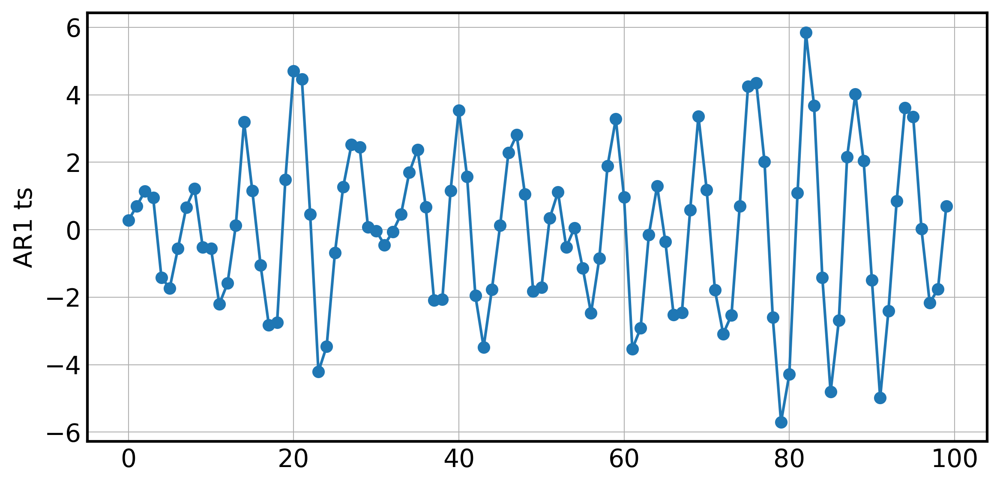

In [ ]:
ax = ar2_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

Корни модели AR 2 получилось комплексными, но их амплитуда - больше 1

In [ ]:
ar2_model.arroots

array([0.5625-0.96622655j, 0.5625+0.96622655j])

In [ ]:
0.96622655**2+0.5625**2

1.2499999959249024

In [ ]:
ar1_ts.mean(),ar1_ts.std()

(-0.020632211710429487, 1.6032502461688993)

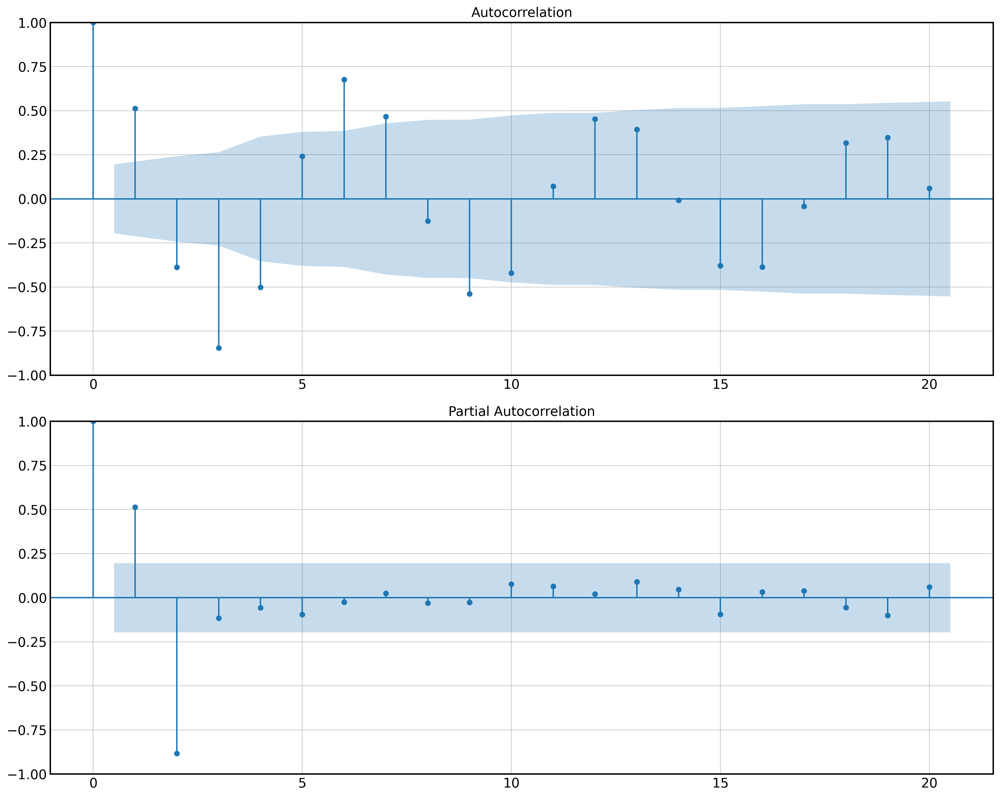

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ar2_ts,ax=ax[0]);
tsaplots.plot_pacf(ar2_ts,ax=ax[1]);

Проверим обратимость модели AR 2 - возьмем первые 10 лагов её обращенной формы создадим модель МА(10) 

In [ ]:
ma_mod = ar2_model.arma2ma(lags=10)

In [ ]:
ma_mod

array([ 1.        ,  0.9       ,  0.01      , -0.711     , -0.6479    ,
       -0.01431   ,  0.505441  ,  0.4663449 ,  0.01535761, -0.35925407])

In [ ]:
ma_mod =  sm.tsa.ArmaProcess(ma=ma_mod,nobs=10000)
ar2_ts_ma = pd.Series(ma_mod.generate_sample())

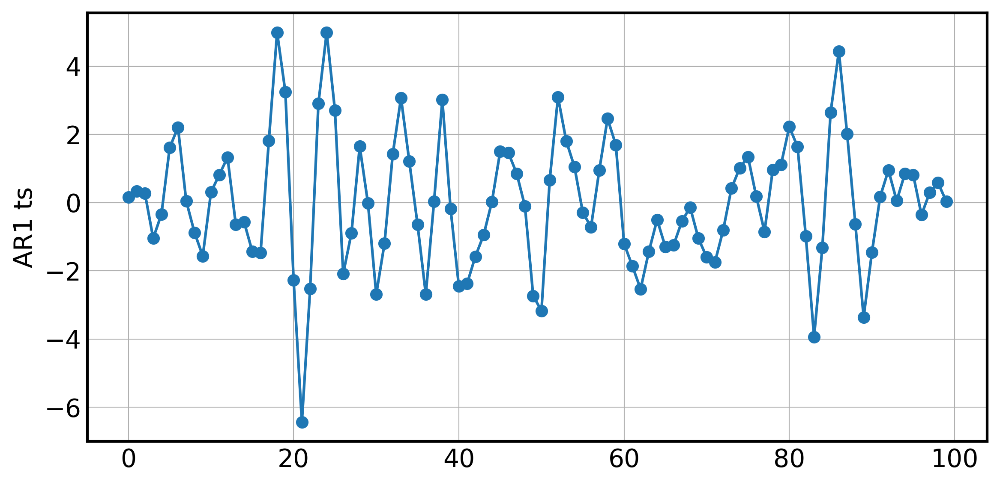

In [ ]:
ax = ar2_ts_ma.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

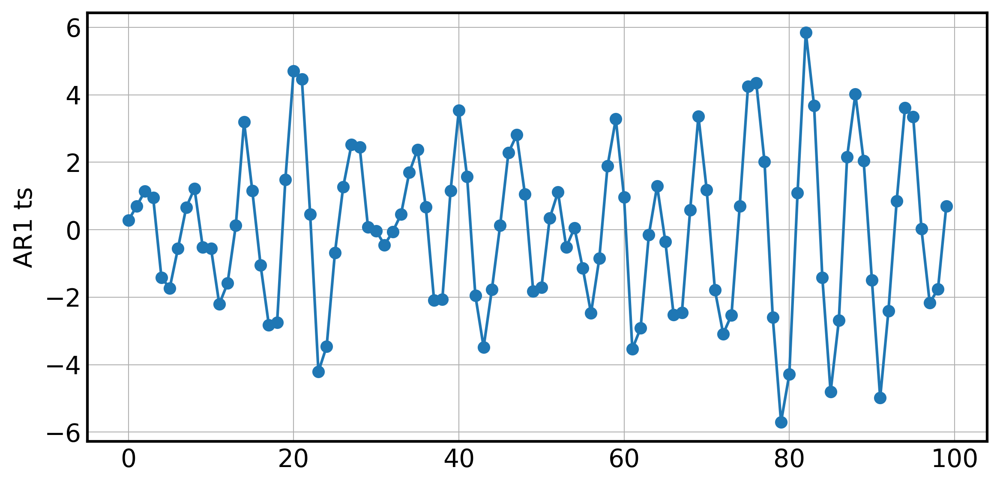

In [ ]:
ax = ar2_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

Обратите внимание, что не смотря на то, что мы изучаем ряд модели МА(10), который мы перегенерировали заново, акф и чакф по прежнему подсказывают нам наличие AR(2)

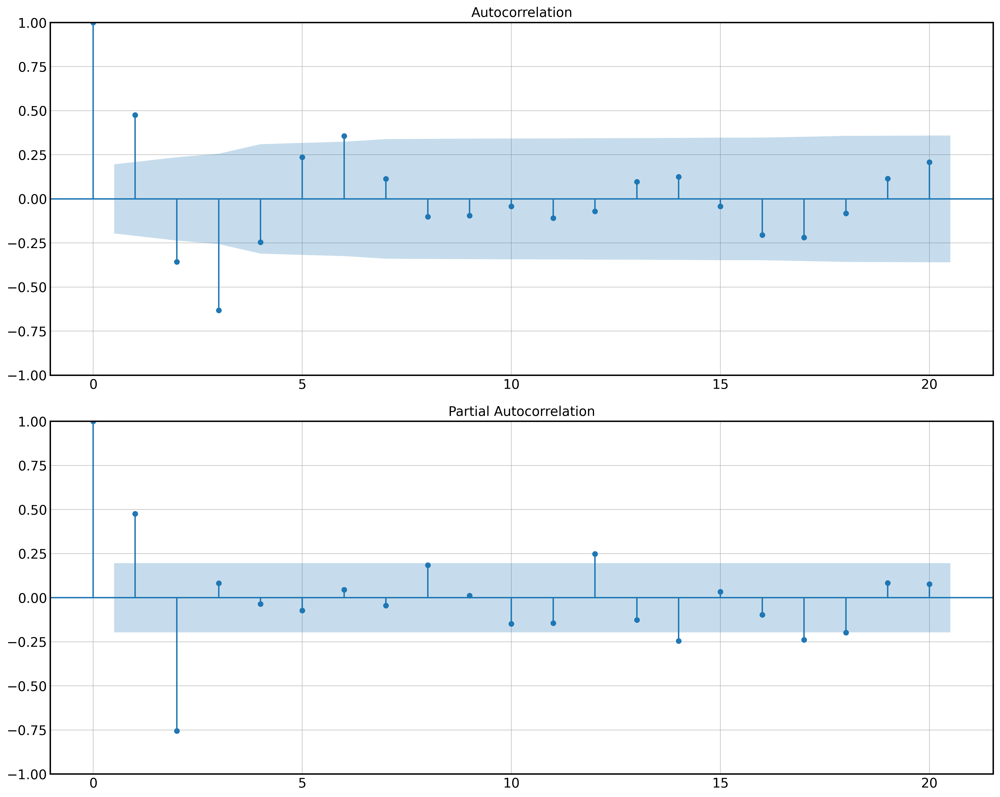

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ar2_ts_ma,ax=ax[0]);
tsaplots.plot_pacf(ar2_ts_ma,ax=ax[1]);

Посмотрим, что будет происходить с обратимость при нестационарной AR-части

In [ ]:
ar2_model = sm.tsa.ArmaProcess(ar=[1, 0.9,-0.15],nobs=10000)
ar2_ts = pd.Series(ar2_model.generate_sample())

In [ ]:
ar2_model.isinvertible,ar2_model.isstationary

(True, False)

Один из корней меньше 1 - модель нестационарна

In [ ]:
ar2_model.arroots

array([-0.95811403,  6.95811403])

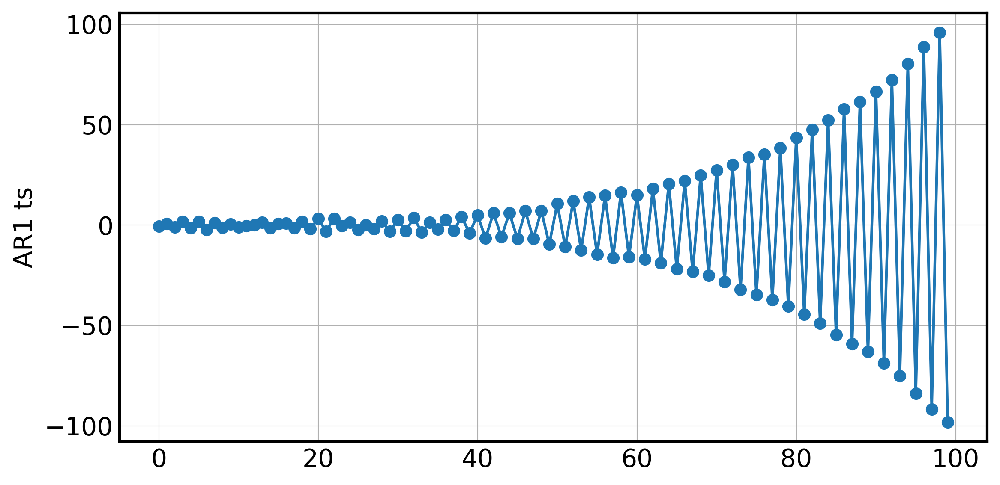

In [ ]:
ax = ar2_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

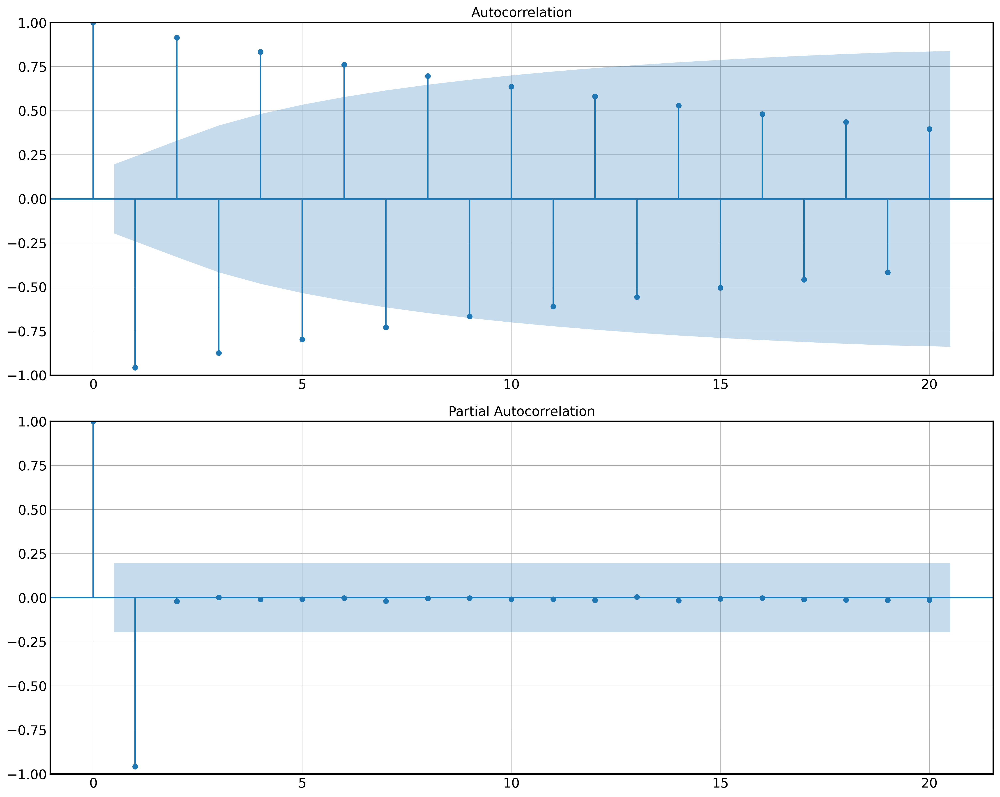

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ar2_ts,ax=ax[0],bartlett_confint=True)
tsaplots.plot_pacf(ar2_ts,ax=ax[1]);

Формально мы можем разложить ряд на ма-процесс, но даже визуально видно, что новый сгенерированный ряд сильно отличается от исходного.

In [ ]:
ma_mod = ar2_model.arma2ma(lags=10)
ma_mod =  sm.tsa.ArmaProcess(ma=ma_mod,nobs=10000)
ar2_ts_ma = pd.Series(ma_mod.generate_sample())

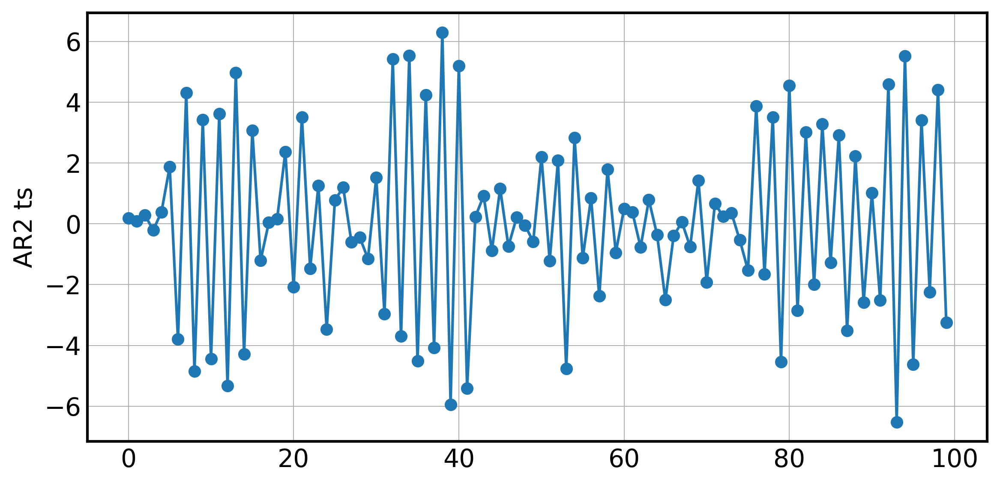

In [ ]:
ax = ar2_ts_ma.plot(legend=False,marker='o')
ax.set_ylabel('AR2 ts');

## Модель МА 2

In [ ]:
ma3_model = sm.tsa.ArmaProcess(ma=[1, 0.9, 0.8],nobs=1000)
ma3_ts = pd.Series(ma3_model.generate_sample(burnin=5000))

In [ ]:
ma3_model.isinvertible,ma3_model.isstationary

(True, True)

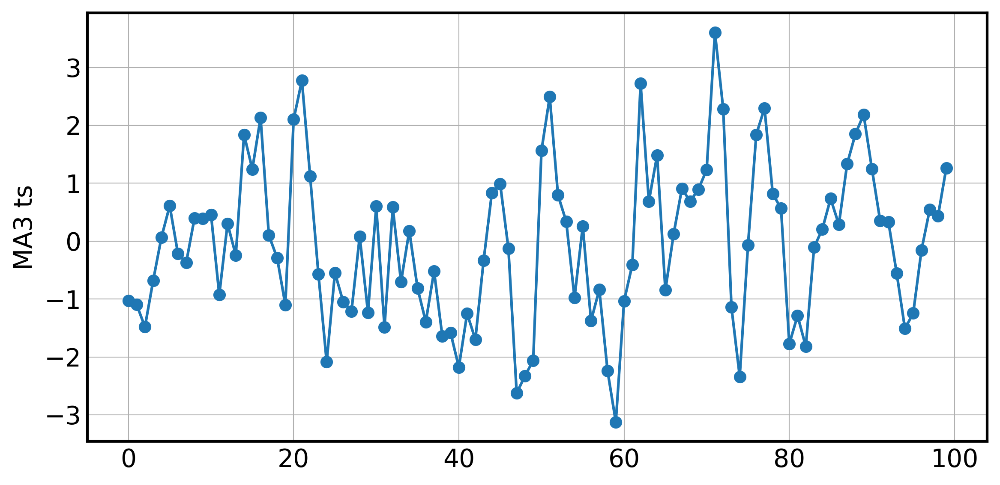

In [ ]:
ax = ma3_ts.plot(legend=False,marker='o')
ax.set_ylabel('MA3 ts');

АКФ МА(2) обнуляется после лага 2, ЧАКФ экспоненциально убывает  

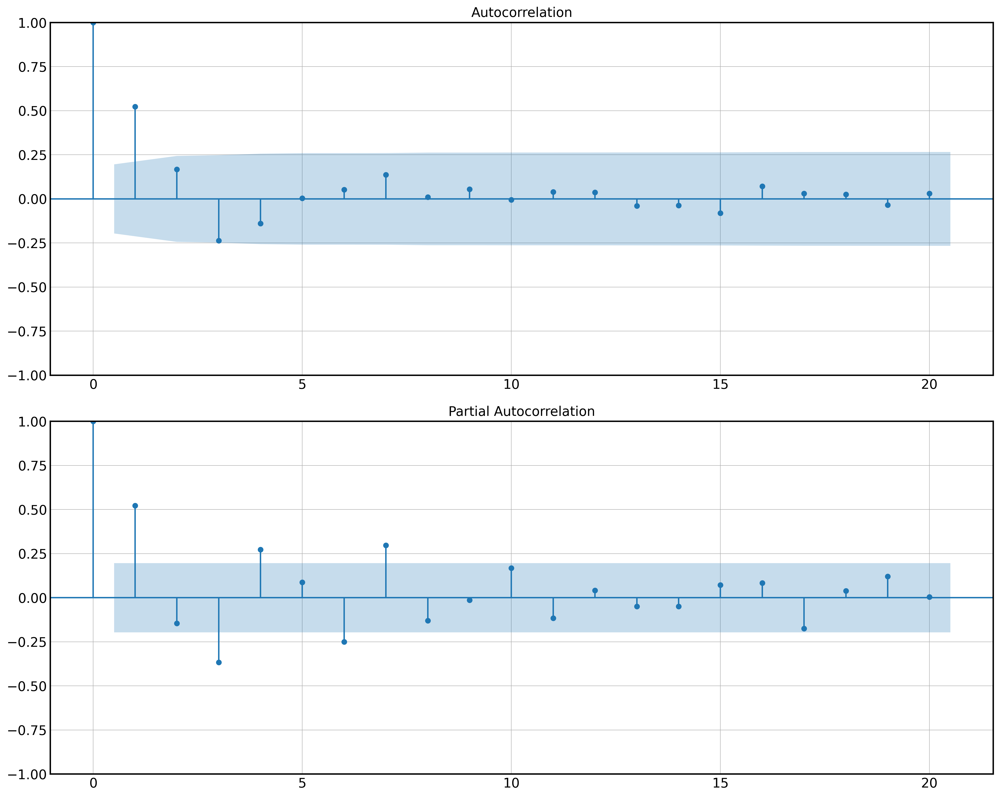

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(ma3_ts,ax=ax[0]);
tsaplots.plot_pacf(ma3_ts,ax=ax[1]);

Убедимся, что сложную МА-модель можно воспроизвести в AR-предствлении

In [ ]:
ma3_model = sm.tsa.ArmaProcess(ar=ma3_model.arma2ar(lags = 10),nobs=1000)
ma3_arts = pd.Series(ma3_model.generate_sample(burnin=10000))

In [ ]:
ma3_model.isinvertible,ma3_model.isstationary

(True, True)

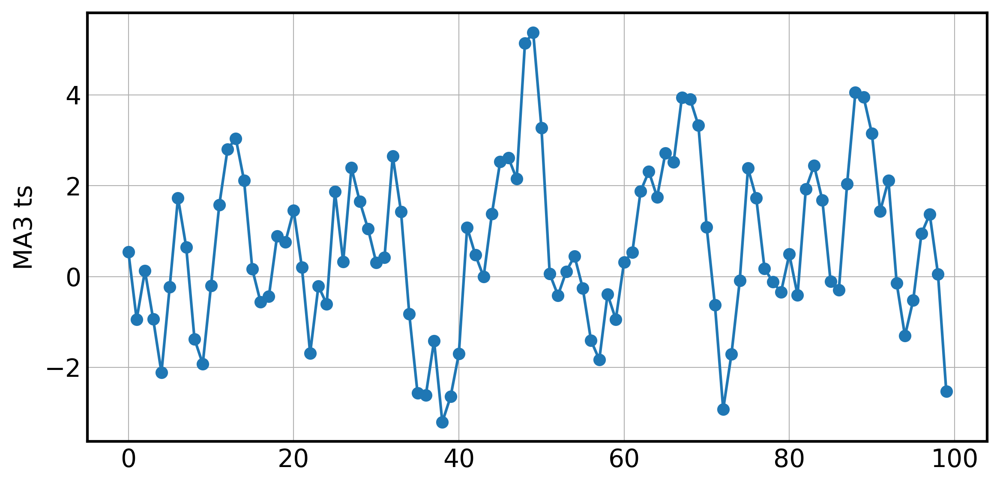

In [ ]:
ax = ma3_arts.plot(legend=False,marker='o')
ax.set_ylabel('MA3 ts');

Если МА необратимо, то попытка перейти к AR-представлению может привести к нестационарному вр

In [ ]:
ma3_model = sm.tsa.ArmaProcess(ma=[1, -0.9, 0.8,0.8],nobs=1000)
ma3_arts = pd.Series(ma3_model.generate_sample(burnin=10000))

In [ ]:
ma3_model.isinvertible,ma3_model.isstationary

(False, True)

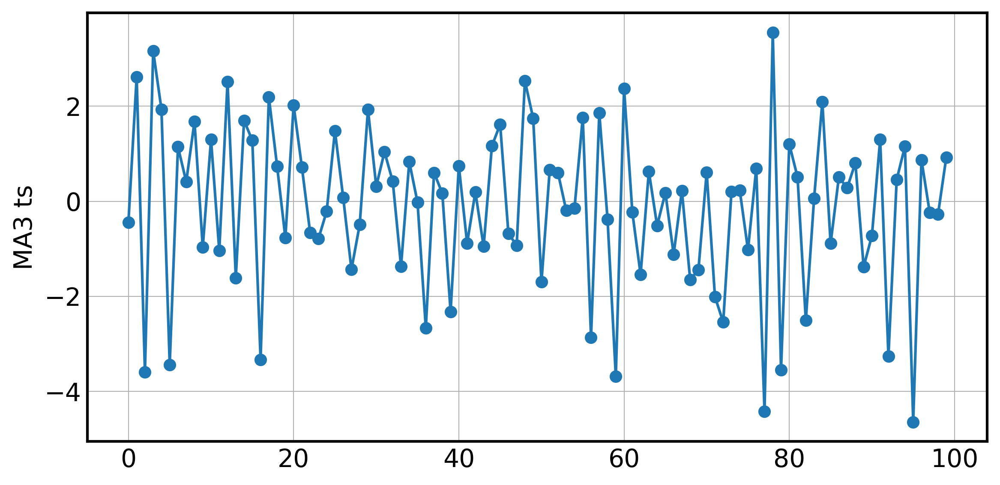

In [ ]:
ax = ma3_arts.plot(legend=False,marker='o')
ax.set_ylabel('MA3 ts');

In [ ]:
ma3_model.arma2ar(lags = 10)

array([ 1.        ,  0.9       ,  0.01      , -1.511     , -2.0879    ,
       -0.67831   ,  2.268641  ,  4.2547449 ,  2.55700561, -2.91740367])

In [ ]:
ma3_ar_model = sm.tsa.ArmaProcess(ar=ma3_model.arma2ar(lags = 10),nobs=1000)
ma3_ar_arts = pd.Series(ma3_ar_model.generate_sample(burnin=10))

In [ ]:
ma3_ar_model.isinvertible,ma3_ar_model.isstationary

(True, False)

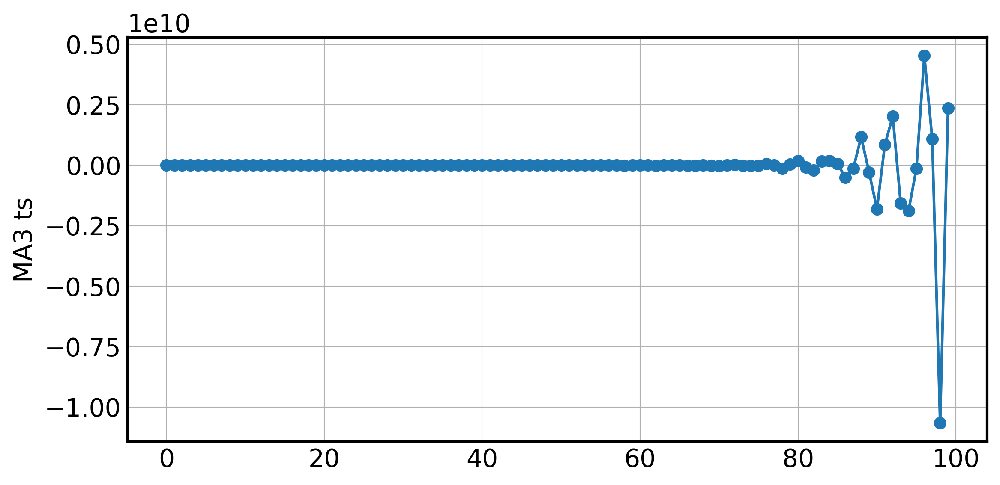

In [ ]:
ax = ma3_ar_arts.plot(legend=False,marker='o')
ax.set_ylabel('MA3 ts');

# Обучение моделей ARMA

## AR 3

In [ ]:
ar3_model = sm.tsa.ArmaProcess(ar=[1, -0.9, 0.8, -0.8], nobs=1000)
ar3_ts = pd.Series(ar3_model.generate_sample(burnin=10000))

In [ ]:
ar3_model.isinvertible,ar3_model.isstationary

(True, True)

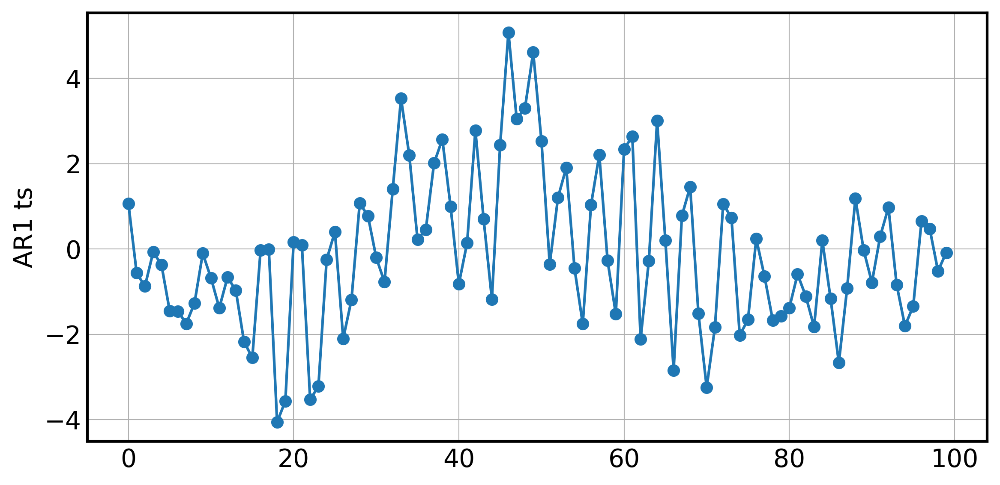

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

Попробуем обучить более простую модель 

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
model = ARIMA(ar3_ts, order = (2,0,0))

model = model.fit()

forecast = model.predict(start=0,end=len(ar3_ts)-1)

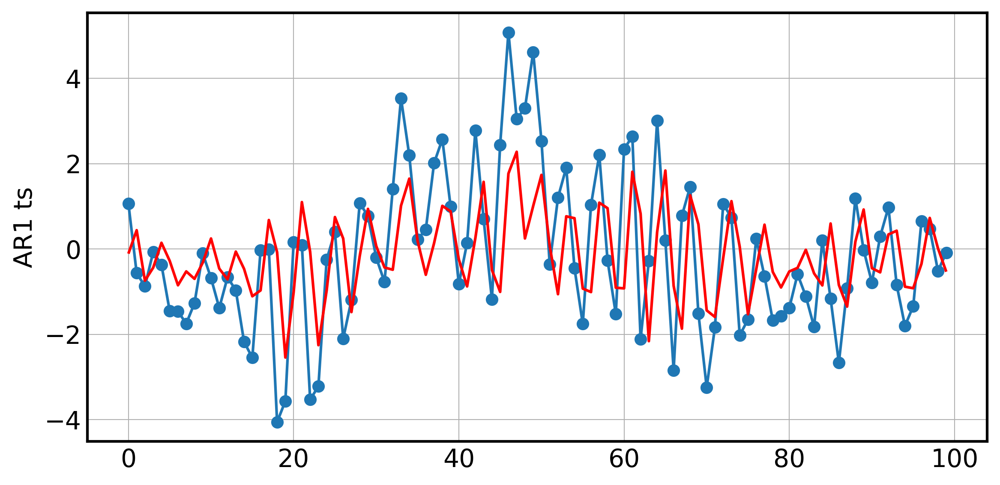

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(forecast,c='red')
ax.set_ylabel('AR1 ts');

Видно, что в остатках остались зависимость, что подтверждается их АКФ и ЧАКФ

In [ ]:
resid = ar3_ts - forecast

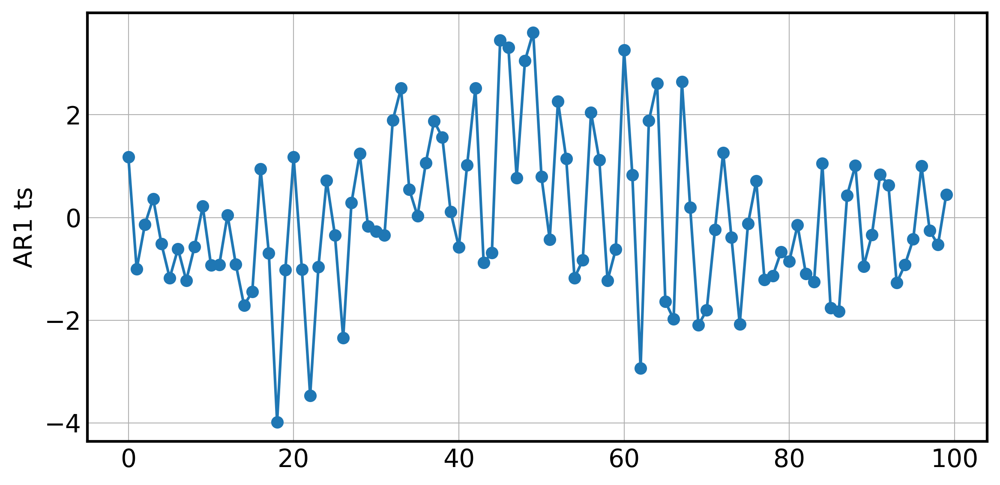

In [ ]:
ax = resid.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

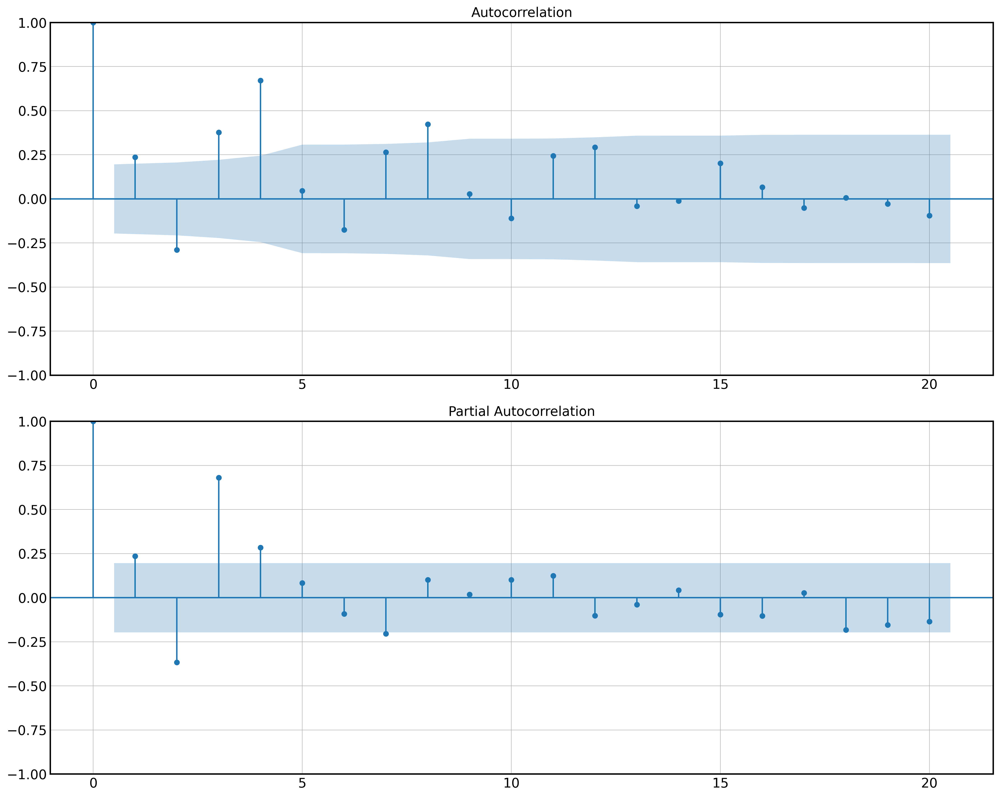

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid,ax=ax[0]);
tsaplots.plot_pacf(resid,ax=ax[1]);

При правильном подборе параметров остатки выглядят как белый шум

In [ ]:
model = ARIMA(ar3_ts,order = (3,0,0))

model = model.fit(method = 'statespace')

forecast = model.predict(start=0,end=len(ar3_ts)-1)

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                 ARIMA(3, 0, 0)   Log Likelihood                -135.882
Date:                Wed, 06 Aug 2025   AIC                            281.763
Time:                        15:29:42   BIC                            294.789
Sample:                             0   HQIC                           287.035
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0717      0.579     -0.124      0.901      -1.206       1.062
ar.L1          0.8489      0.057     14.782      0.000       0.736       0.961
ar.L2         -0.7802      0.064    -12.275      0.000      -0.905      -0.656
ar.L3          0.7682      0.068     11.338      0.000       0.635       0.901
sigma2         0.8594      0.147      5.858      0.000       0.572       1.147
===================================================================================
Ljung-Box (L1) (Q):                   1.64   Jarque-Bera (JB):                 1.93
Prob(Q):                              0.20   Prob(JB):                         0.38
Heteroskedasticity (H):               1.26   Skew:                             0.34
Prob(H) (two-sided):                  0.52   Kurtosis:                         2.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

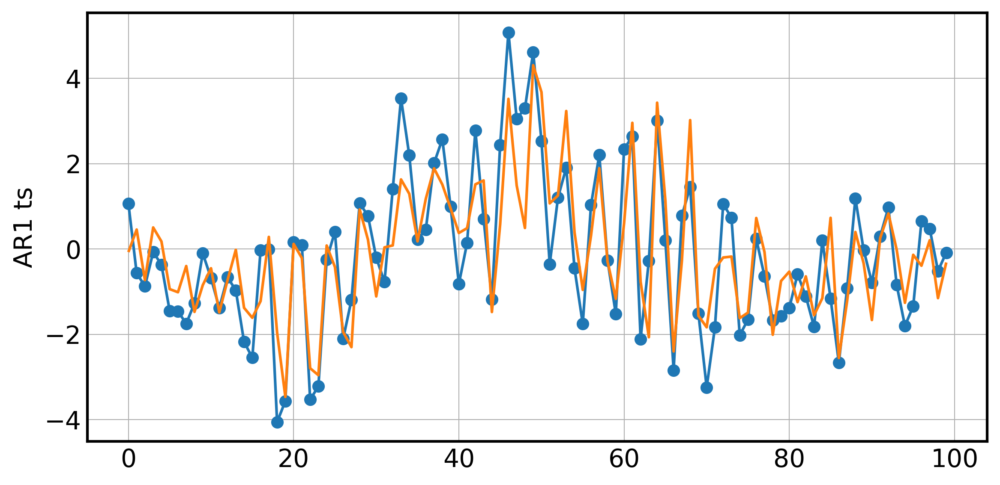

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(forecast)
ax.set_ylabel('AR1 ts');

Остатки выглядят как белый шум, что подтверждается, в первую очередь, АКФ и ЧАКФ

In [ ]:
resid = ar3_ts - forecast

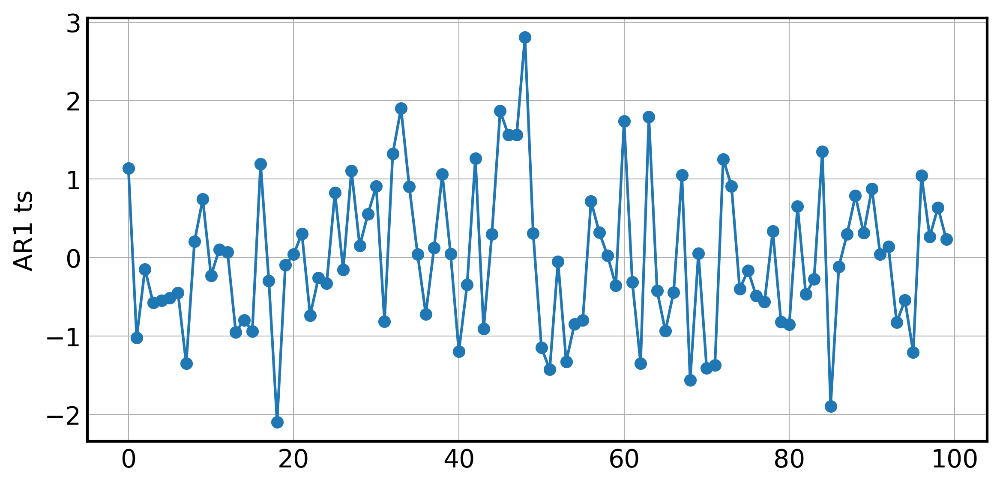

In [ ]:
ax = resid.plot(legend=False,marker='o')
ax.set_ylabel('AR1 ts');

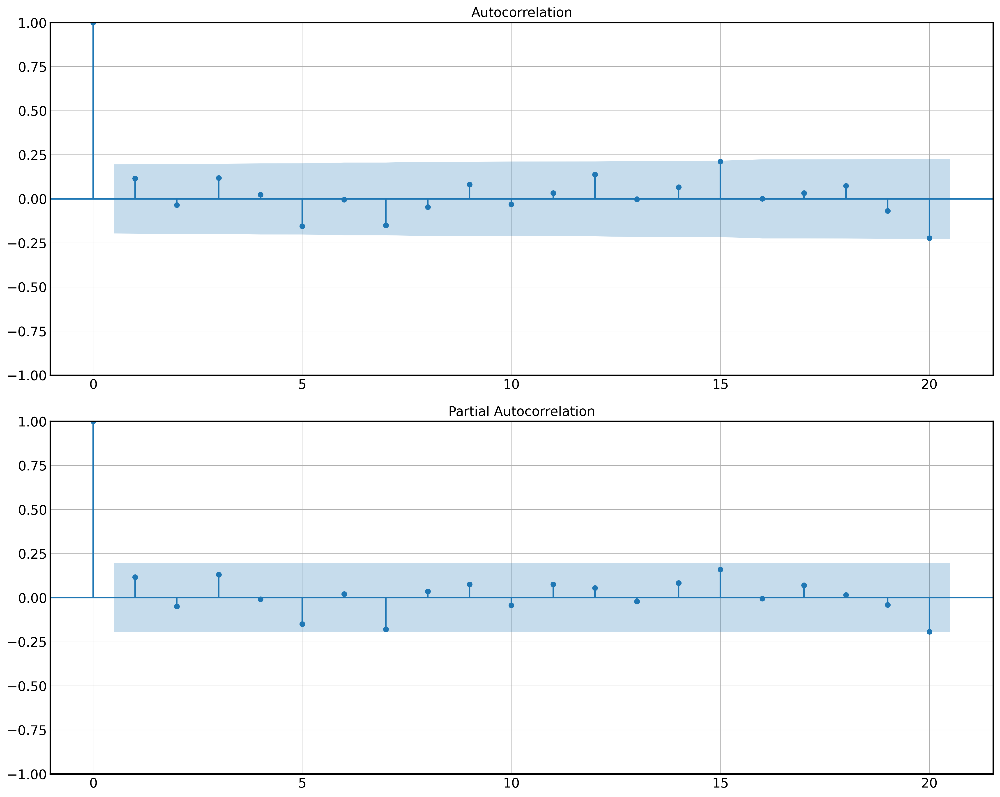

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid,ax=ax[0]);
tsaplots.plot_pacf(resid,ax=ax[1]);

Если обучим модель с большим колличеством параметров остатки также выглядят как белый шум

In [ ]:
model = ARIMA(ar3_ts,order = (5,0,0))

model = model.fit(method = 'statespace')

forecast = model.predict(start=0,end=len(ar3_ts)-1)

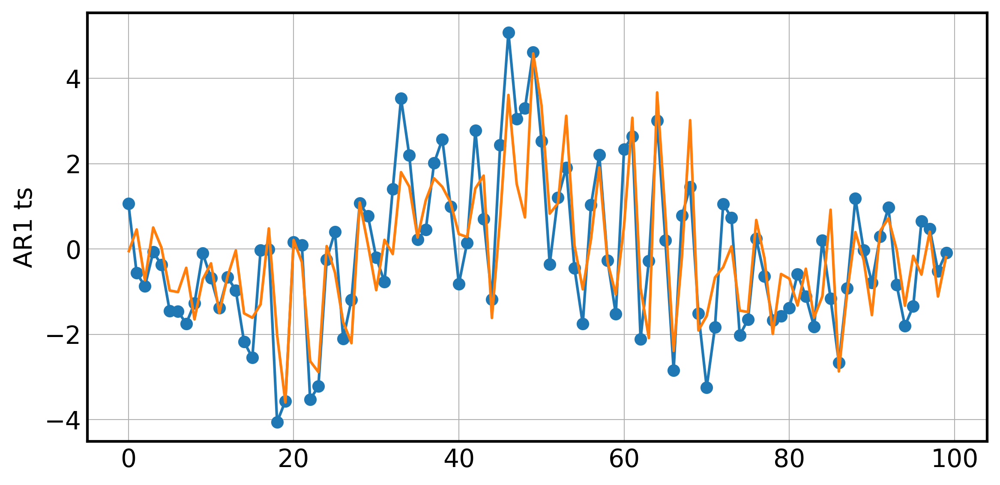

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(forecast)
ax.set_ylabel('AR1 ts');

In [ ]:
resid = ar3_ts - forecast

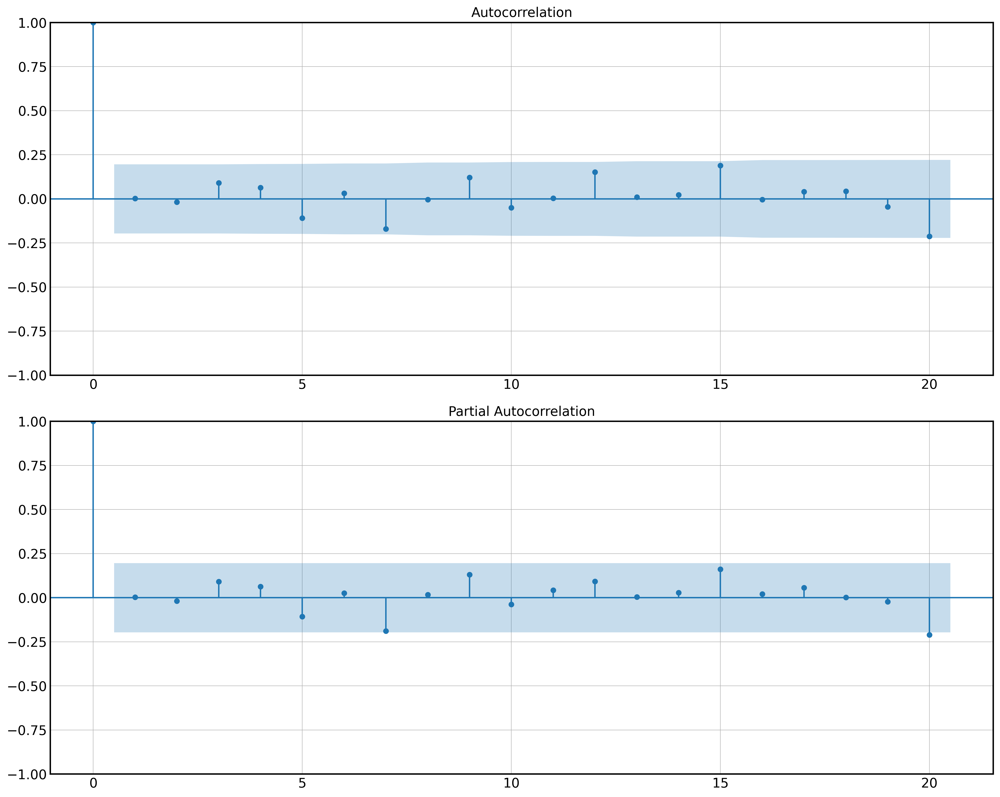

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid,ax=ax[0]);
tsaplots.plot_pacf(resid,ax=ax[1]);

не смотря на наличие 5 лагов, только первый три статзначимо отличны от нуля

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                 ARIMA(5, 0, 0)   Log Likelihood                -134.542
Date:                Wed, 06 Aug 2025   AIC                            283.085
Time:                        15:29:49   BIC                            301.321
Sample:                             0   HQIC                           290.465
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0781      0.523     -0.149      0.881      -1.103       0.947
ar.L1          0.9805      0.098      9.956      0.000       0.788       1.174
ar.L2         -0.9460      0.145     -6.510      0.000      -1.231      -0.661
ar.L3          0.9428      0.141      6.672      0.000       0.666       1.220
ar.L4         -0.1985      0.142     -1.402      0.161      -0.476       0.079
ar.L5          0.0441      0.103      0.428      0.669      -0.158       0.246
sigma2         0.8356      0.146      5.715      0.000       0.549       1.122
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 1.61
Prob(Q):                              0.91   Prob(JB):                         0.45
Heteroskedasticity (H):               1.27   Skew:                             0.29
Prob(H) (two-sided):                  0.49   Kurtosis:                         2.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

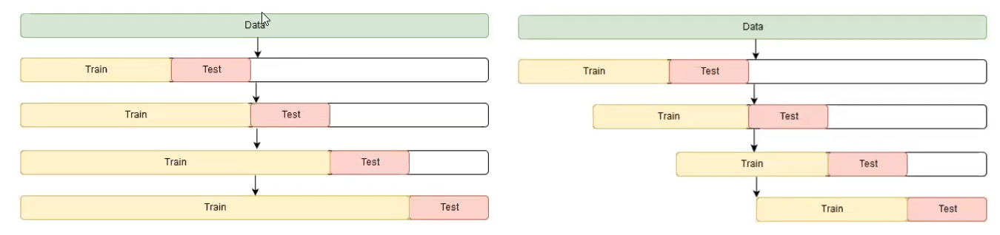

При прогнозирования с кросс-валидацией в моделях ARMA можно итерироваться как с переобучением модели на каждом шаге, так и без переобучения, просто с подстановкой новых значений вр

In [ ]:
one_step_ahed_preds_ar3 = []
model = ARIMA(ar3_ts.iloc[:50],order = (3,0,0))
model.fit(method = 'statespace')
for i in range(50,100):
    model = ARIMA(ar3_ts.iloc[:i],order = (3,0,0))
    model = model.fit(method = 'statespace')
    one_step_ahed_preds_ar3.append(model.forecast(steps=1).values[0])

In [ ]:
one_step_update_ahed_preds_ar3 = []
model = ARIMA(ar3_ts.iloc[:50],order = (3,0,0))
model = model.fit(method = 'statespace')
for i in range(50,100):
    model = model.append(ar3_ts[i:i+1].values, refit=False)
    one_step_update_ahed_preds_ar3.append(model.forecast(steps=1).values[0])

In [ ]:
one_step_ahed_forecast_ar3 = pd.Series([0]*50+one_step_ahed_preds_ar3)
one_step_update_ahed_forecast_ar3 = pd.Series([0]*50+one_step_update_ahed_preds_ar3)

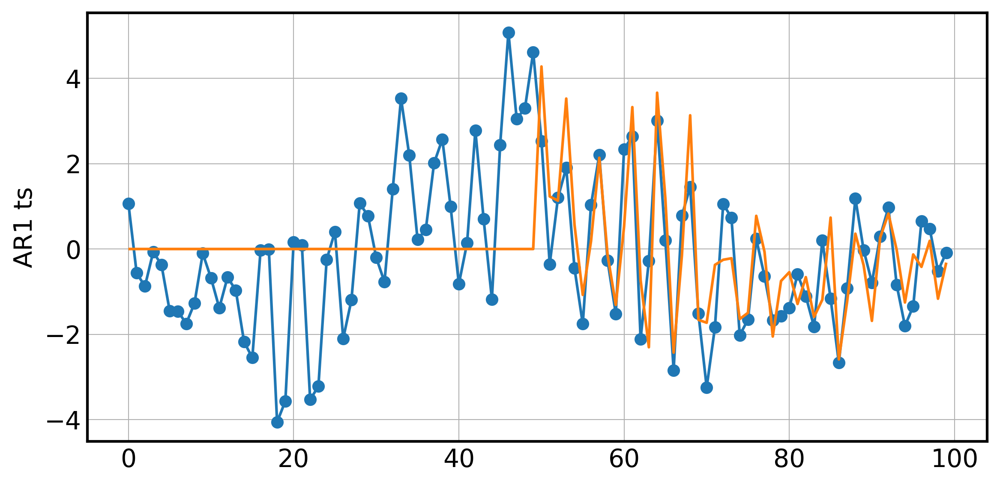

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(one_step_ahed_forecast_ar3)
ax.set_ylabel('AR1 ts');

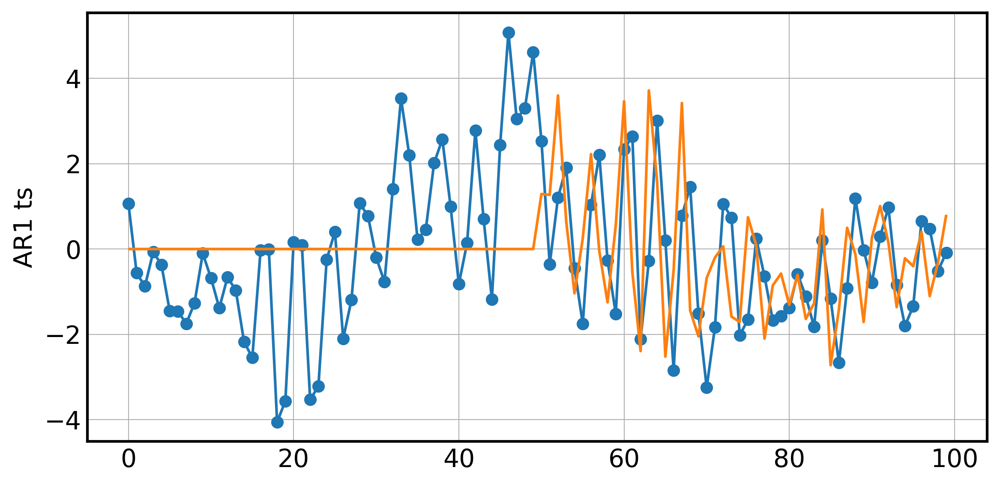

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(one_step_update_ahed_forecast_ar3)
ax.set_ylabel('AR1 ts');

In [ ]:
resid = ar3_ts.iloc[50:]-one_step_update_ahed_forecast_ar3.iloc[50:]
resid1 = ar3_ts.iloc[50:]-one_step_ahed_forecast_ar3.iloc[50:]

<Axes: >

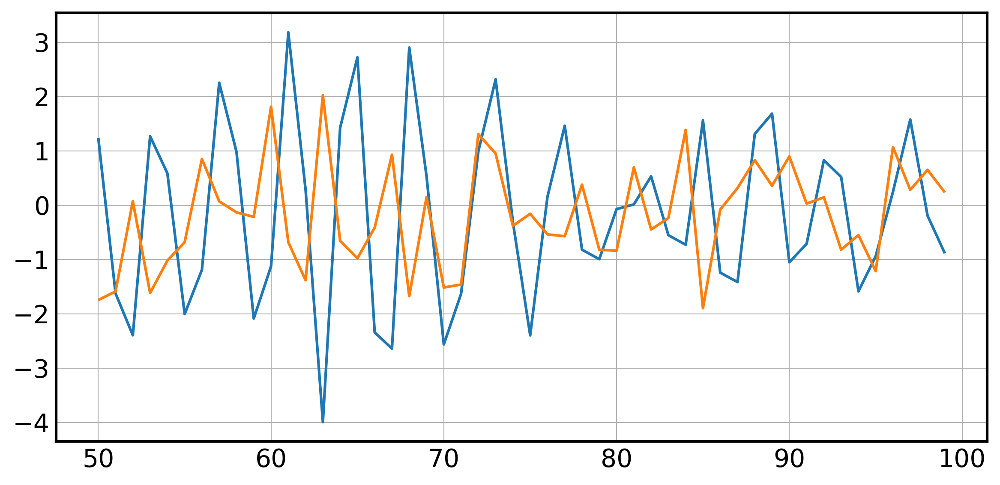

In [ ]:
resid.plot()
resid1.plot()

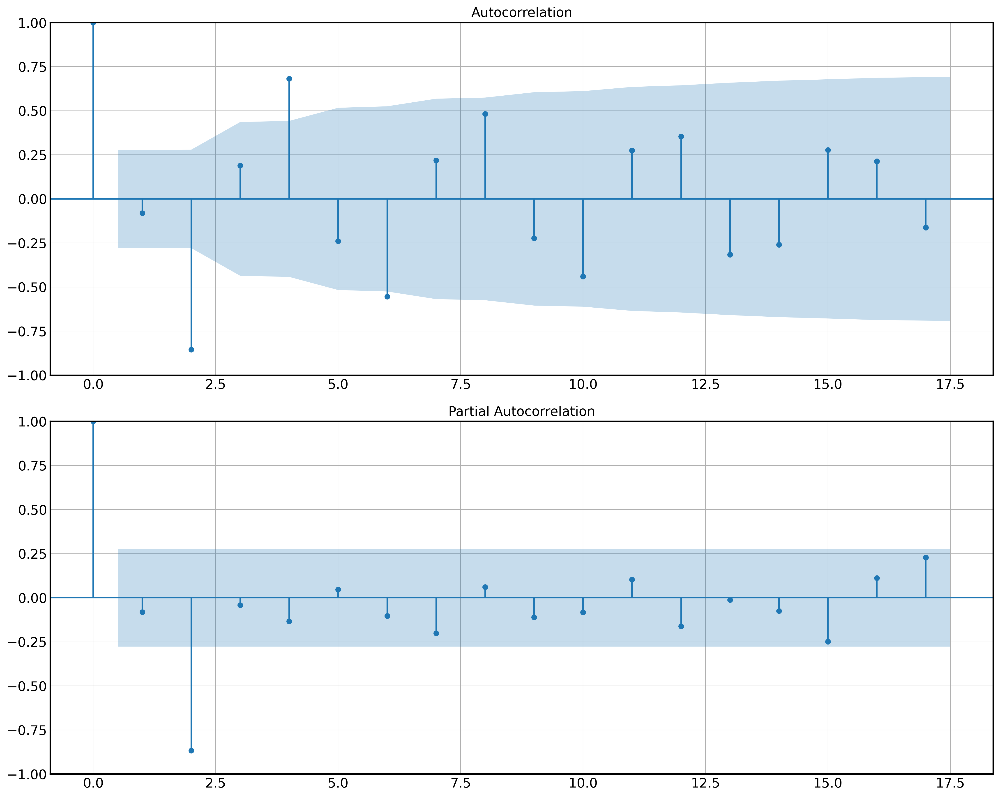

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid,ax=ax[0]);
tsaplots.plot_pacf(resid,ax=ax[1]);

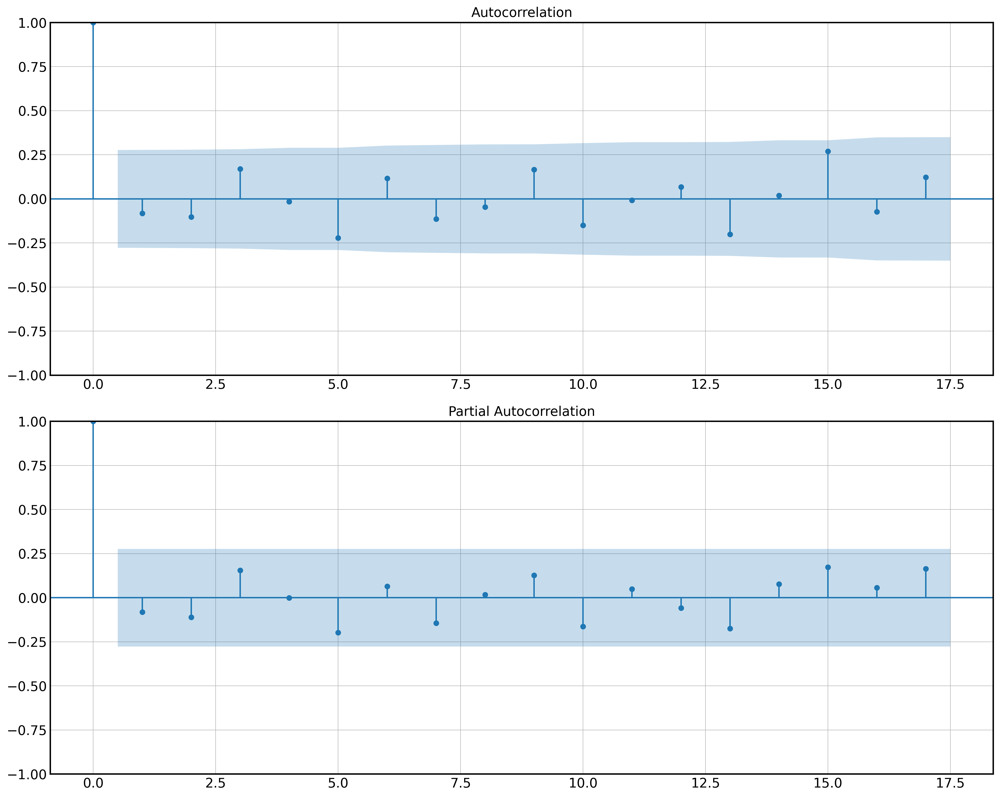

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid1,ax=ax[0]);
tsaplots.plot_pacf(resid1,ax=ax[1]);

При прогнозировании на большой горизонт предикты модели ARMA быстро выходят на среднее значение вр

In [ ]:
model3 = ARIMA(ar3_ts,order = (3,0,0)).fit()

In [ ]:
forecast_dyn3 = model3.predict(start=0,end=len(ar3_ts)-1, dynamic=50)

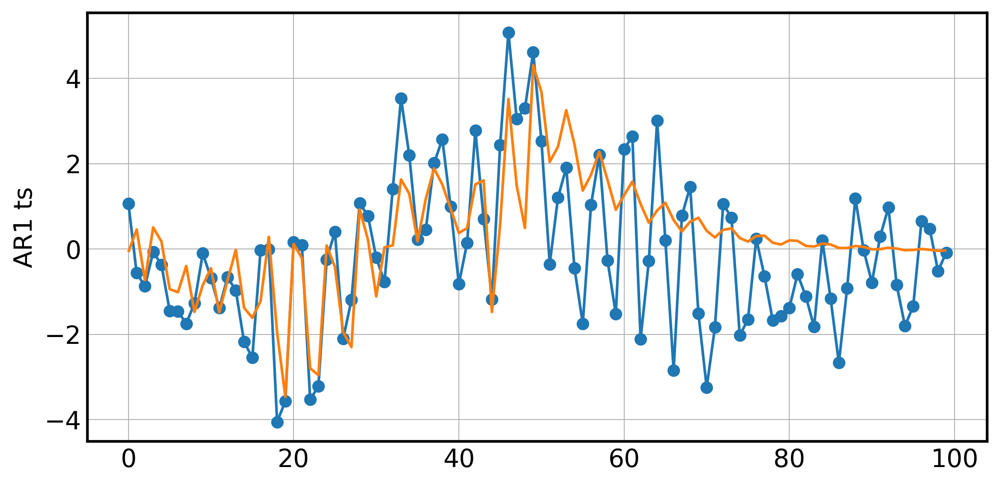

In [ ]:
ax = ar3_ts.plot(legend=False,marker='o')
ax.plot(forecast_dyn3)
ax.set_ylabel('AR1 ts');

Попробуем обучить модели для нестационарного процесса

In [ ]:
ar2_model = sm.tsa.ArmaProcess(ar=[1, 0.9,-0.15],nobs=10000)
ar2_ts = pd.Series(ar2_model.generate_sample(burnin=5000))

In [ ]:
ar2_model.isinvertible,ar2_model.isstationary

(True, False)

In [ ]:
ar2_model.arroots

array([-0.95811403,  6.95811403])

In [ ]:
model1 = ARIMA(ar2_ts,order = (2,0,0),enforce_stationarity=False)

model = model1.fit(method='yule_walker')

forecast = model.predict(start=0,end=len(ar2_ts)-1)

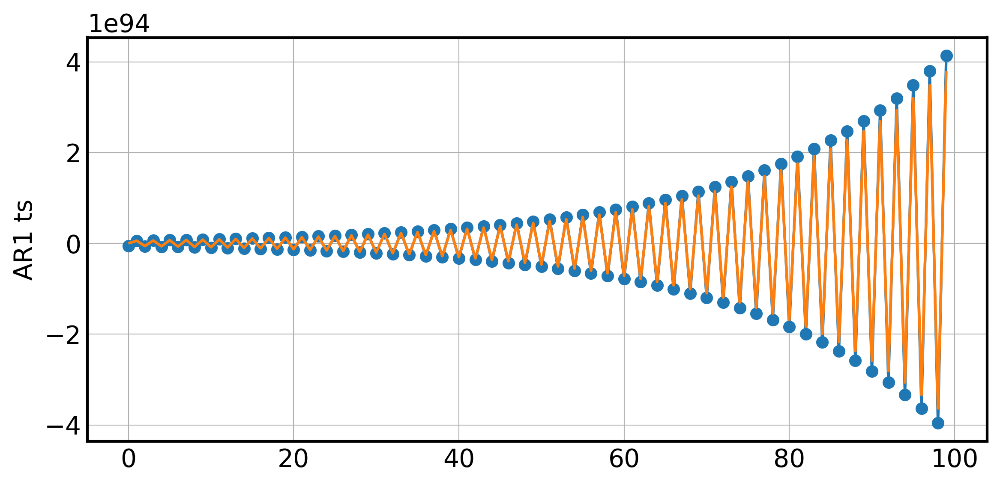

In [ ]:
ax = ar2_ts.plot(legend=False,marker='o')
ax.plot(forecast)
ax.set_ylabel('AR1 ts');

In [ ]:
resid = ar2_ts - forecast

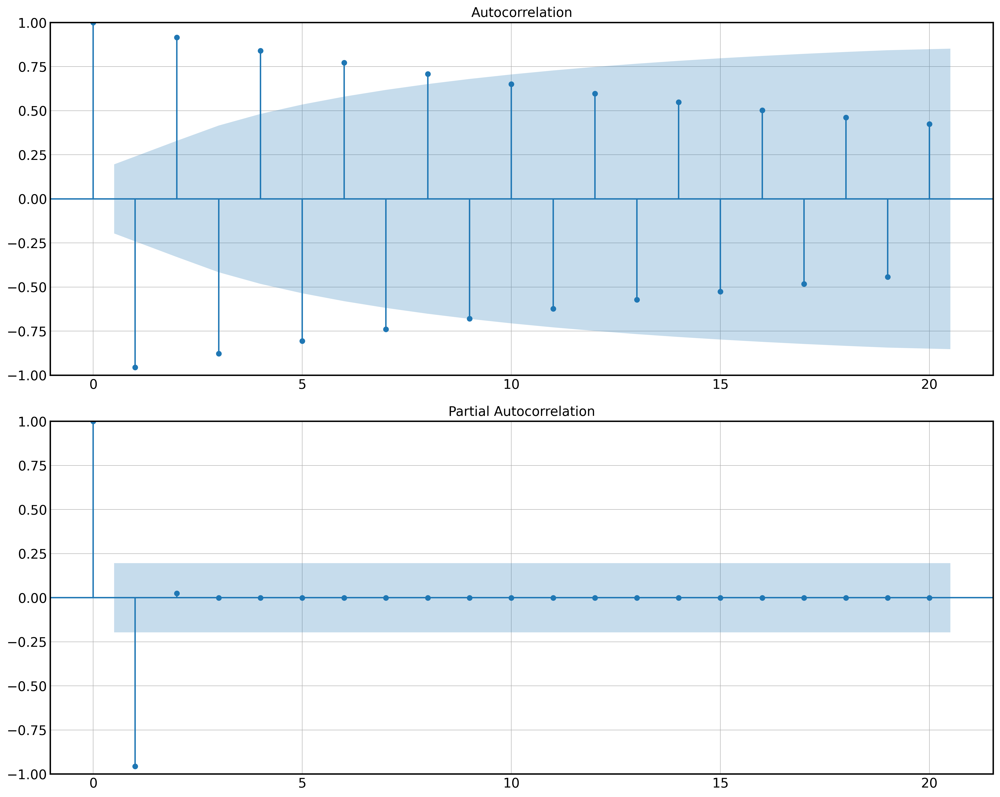

In [ ]:
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(resid,ax=ax[0]);
tsaplots.plot_pacf(resid,ax=ax[1]);

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                 ARIMA(2, 0, 0)   Log Likelihood              -21218.962
Date:                Wed, 06 Aug 2025   AIC                          42445.924
Time:                        15:30:20   BIC                          42456.264
Sample:                             0   HQIC                         42450.106
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8.924e+90        nan        nan        nan         nan         nan
ar.L1         -0.9585     79.207     -0.012      0.990    -156.202     154.285
ar.L2         -0.0004     82.673  -5.04e-06      1.000    -162.036     162.035
sigma2     1.708e+187         -0       -inf      0.000   1.71e+187   1.71e+187
===================================================================================
Ljung-Box (L1) (Q):                  92.74   Jarque-Bera (JB):                 5.87
Prob(Q):                              0.00   Prob(JB):                         0.05
Heteroskedasticity (H):             252.97   Skew:                             0.08
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

In [ ]:
model.arroots

array([-1.04375565e+00, -2.30027431e+03])

In [ ]:
np.abs(model.arroots)

array([1.04375565e+00, 2.30027431e+03])

In [ ]:
ar2_model = sm.tsa.ArmaProcess(ar=[1]+list(model.arparams*-1),nobs=10000)
ar2_ts = pd.Series(ar2_model.generate_sample())

In [ ]:
ar2_model.isinvertible,ar2_model.isstationary

(True, True)

<Axes: >

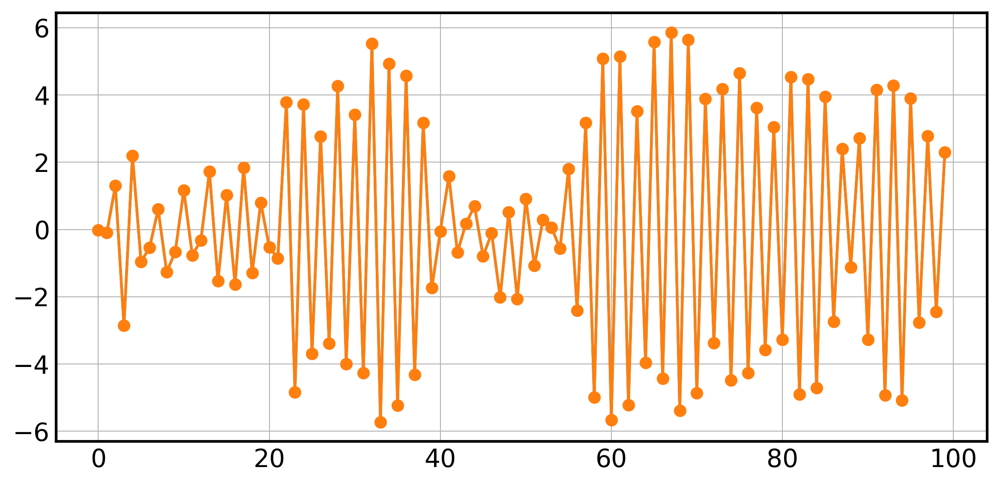

In [ ]:
ar2_ts.plot()
ar2_ts.plot(legend=False,marker='o')

## ARMA (1,1)

In [ ]:
arma11_model = sm.tsa.ArmaProcess(ar=[1,0.5],ma=[1, -0.4,],nobs=1000)
arma11_ts = pd.Series(arma11_model.generate_sample(burnin=10000))

In [ ]:
arma11_model.isinvertible,arma11_model.isstationary

(True, True)

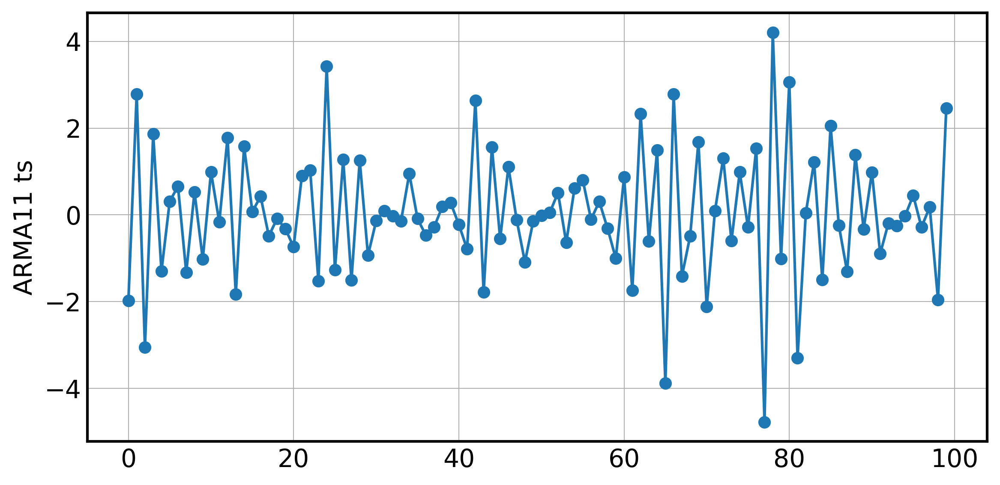

In [ ]:
ax = arma11_ts.plot(legend=False,marker='o')
ax.set_ylabel('ARMA11 ts');

Строим графики автокорреляционной функции (ACF) и частичной автокорреляционной функции (PACF) и из этих графиков определяем примерные значения параметров p; q.


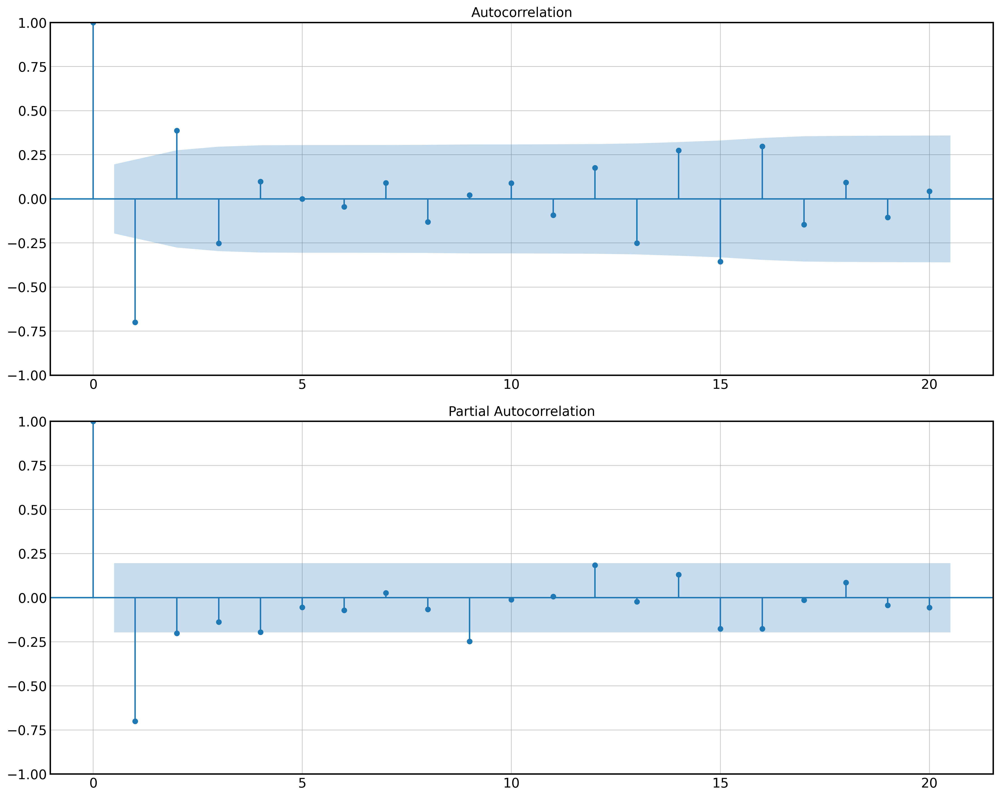

In [ ]:
#q=2
#p=2
#
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(arma11_ts,ax=ax[0]);
tsaplots.plot_pacf(arma11_ts,ax=ax[1]);

In [ ]:
model = ARIMA(arma11_ts,order = (2,0,2))

model = model.fit()

forecast = model.predict(start=0,end=len(arma11_ts)-1)

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                 ARIMA(2, 0, 2)   Log Likelihood                -139.663
Date:                Wed, 06 Aug 2025   AIC                            291.326
Time:                        15:30:26   BIC                            306.958
Sample:                             0   HQIC                           297.653
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0519      0.021      2.427      0.015       0.010       0.094
ar.L1         -0.1358      0.406     -0.334      0.738      -0.933       0.661
ar.L2          0.3442      0.185      1.858      0.063      -0.019       0.707
ma.L1         -0.8270      0.434     -1.906      0.057      -1.677       0.023
ma.L2         -0.0309      0.290     -0.107      0.915      -0.600       0.538
sigma2         0.9441      0.134      7.067      0.000       0.682       1.206
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 6.91
Prob(Q):                              1.00   Prob(JB):                         0.03
Heteroskedasticity (H):               1.68   Skew:                            -0.41
Prob(H) (two-sided):                  0.14   Kurtosis:                         4.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

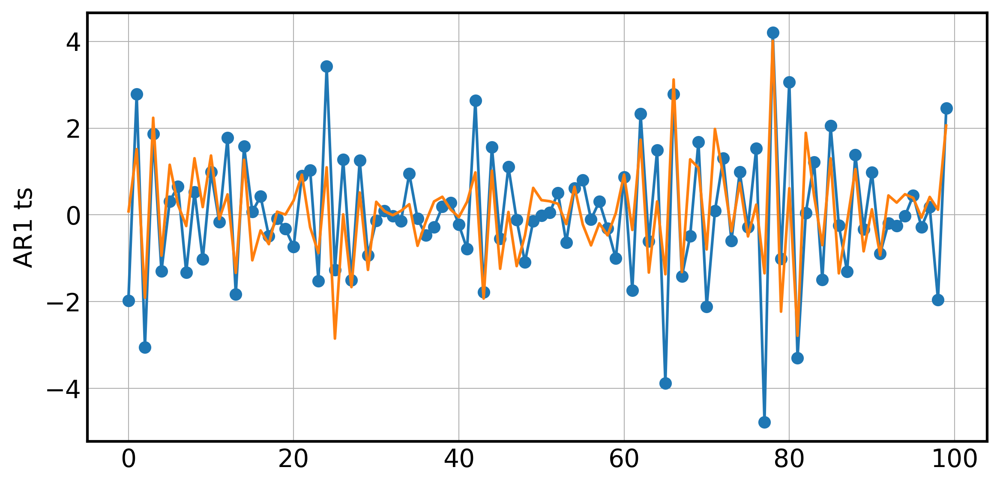

In [ ]:
ax = arma11_ts.plot(legend=False,marker='o')
ax.plot(model.fittedvalues)
ax.set_ylabel('AR1 ts');

In [ ]:
1 - model.resid.std()/arma11_ts.std()

0.3353753667763403

## ARMA(2,2)

In [ ]:
arma22_model = sm.tsa.ArmaProcess(ar=[1,0.5,0.55],ma=[1, -0.4, 0.3],nobs=1000)
arma22_ts = pd.Series(arma22_model.generate_sample(burnin=10000))

In [ ]:
arma22_model.isinvertible,arma22_model.isstationary

(True, True)

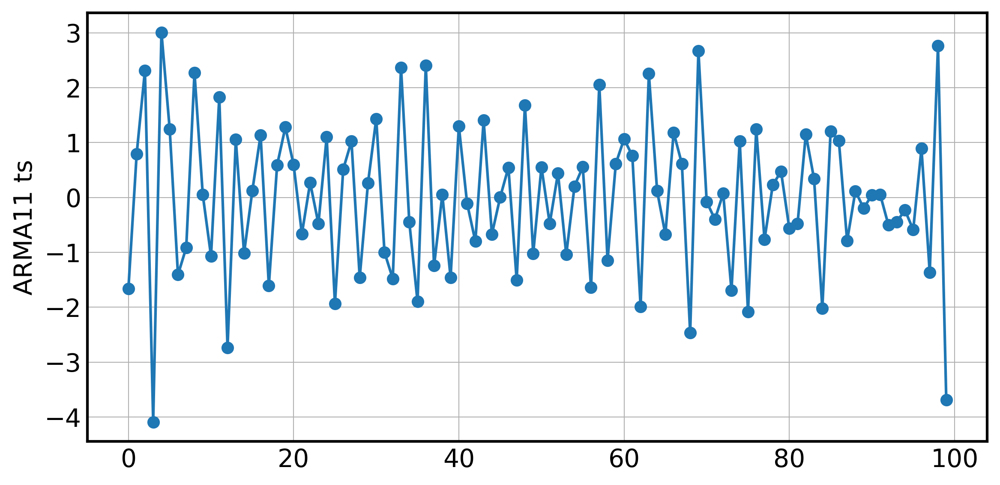

In [ ]:
ax = arma22_ts.plot(legend=False,marker='o')
ax.set_ylabel('ARMA11 ts');

Строим графики автокорреляционной функции (ACF) и частичной автокорреляционной функции (PACF) и из этих графиков определяем примерные значения параметров p; q.


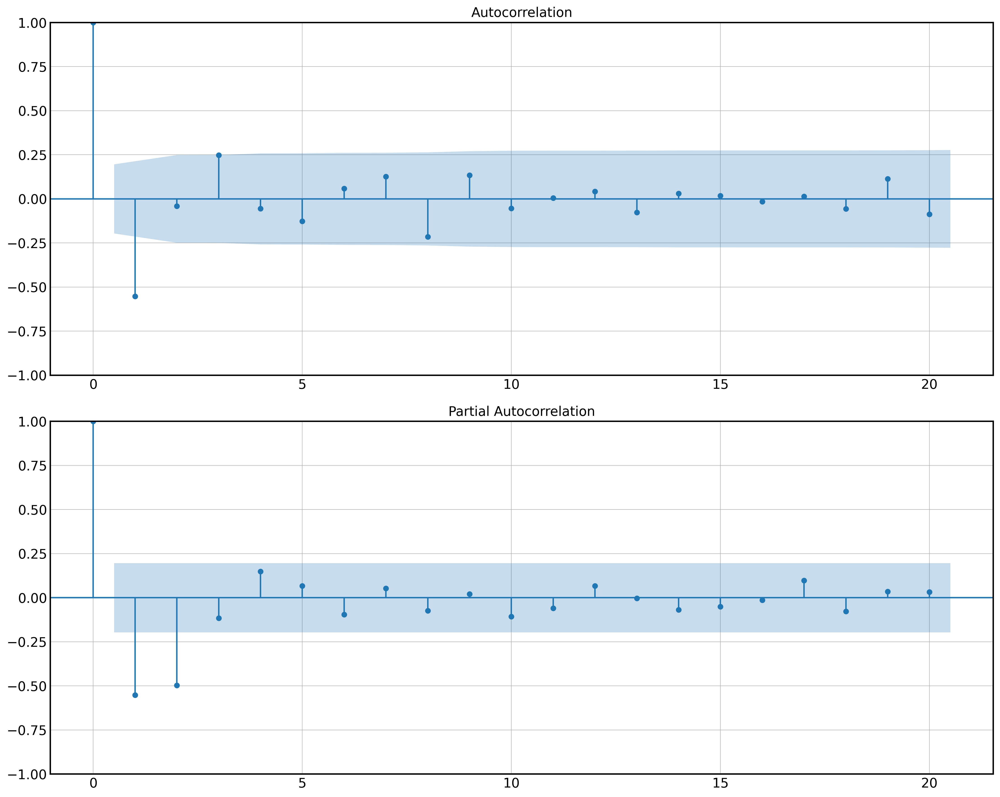

In [ ]:
# q = 3
# p = 2
fig,ax =plt.subplots(2,1,figsize= (15,12)) 
tsaplots.plot_acf(arma22_ts,ax=ax[0]);
tsaplots.plot_pacf(arma22_ts,ax=ax[1]);

In [ ]:
ps = range(0, 3)
qs = range(0, 4)

In [ ]:
parameters = product(ps, qs)
parameters_list = list(parameters)
len(parameters_list)

12

In [ ]:
parameters_list

[(0, 0),
 (0, 1),
 (0, 2),
 (0, 3),
 (1, 0),
 (1, 1),
 (1, 2),
 (1, 3),
 (2, 0),
 (2, 1),
 (2, 2),
 (2, 3)]

In [108]:
%%time
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

for param in parameters_list:
    #try except нужен, потому что на некоторых наборах параметров модель не обучается
    try:
        model=ARIMA(arma22_ts, order=(param[0], 0, param[1])).fit()
    #выводим параметры, на которых модель не обучается и переходим к следующему набору
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.aic
    bic = model.bic
    #сохраняем лучшую модель, aic, параметры
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic, model.bic])
    
warnings.filterwarnings('default')

CPU times: user 11.6 s, sys: 101 ms, total: 11.7 s
Wall time: 4.69 s


In [ ]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic', 'bic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(result_table.sort_values(by = 'bic', ascending=True).head())

   parameters         aic         bic
10     (2, 2)  282.299465  297.930486
8      (2, 0)  283.552617  293.973298
11     (2, 3)  283.949541  302.185732
2      (0, 2)  284.209924  294.630605
9      (2, 1)  284.355273  297.381124
   parameters         aic         bic
8      (2, 0)  283.552617  293.973298
2      (0, 2)  284.209924  294.630605
9      (2, 1)  284.355273  297.381124
10     (2, 2)  282.299465  297.930486
3      (0, 3)  286.209257  299.235108


In [ ]:
model_aic = ARIMA(arma22_ts,order=(2,0,0)).fit()
model_bic = ARIMA(arma22_ts,order=(2,0,1)).fit()

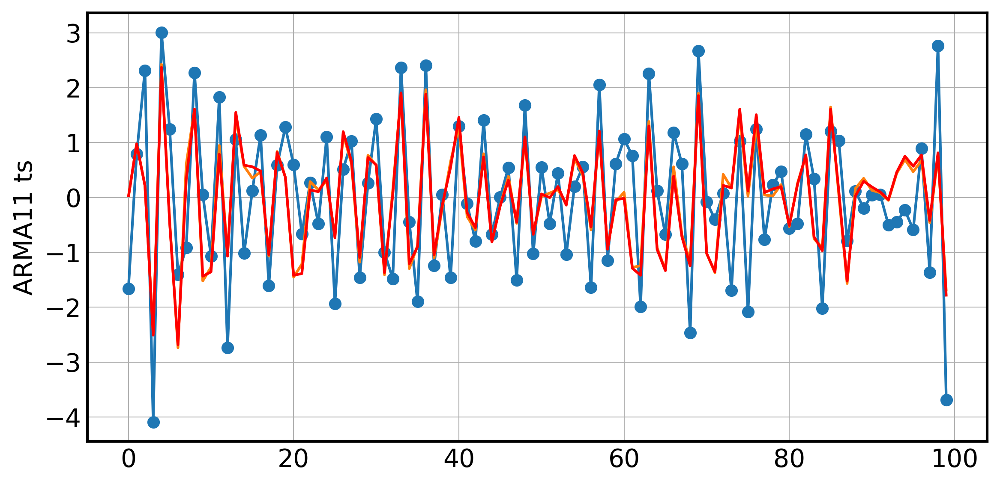

In [ ]:
ax = arma22_ts.plot(legend=False,marker='o')
ax.plot(model_aic.fittedvalues)
ax.plot(model_bic.fittedvalues,c='red')
ax.set_ylabel('ARMA11 ts');

In [ ]:
model_aic.resid.std(),model_bic.resid.std()

(0.9668888014117042, 0.9613496876138662)

In [ ]:
arma22_ts.std()

1.3886458323639232

Сравним нашу модель с автоаримой

In [ ]:
from sktime.forecasting.arima import AutoARIMA

In [ ]:
forecaster = AutoARIMA(seasonal=False,
                       d=0, 
                       max_p=5, 
                       max_q=5,
                       information_criterion = 'aicc',
                       suppress_warnings=True)   

In [ ]:
forecaster.fit(arma22_ts)

/home/den/miniconda3/envs/universal-py12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/den/miniconda3/envs/universal-py12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/den/miniconda3/envs/universal-py12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/den/miniconda3/envs/universal-py12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/den/miniconda3/envs/universal-py12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:1

AutoARIMA(d=0, information_criterion='aicc', seasonal=False,
          suppress_warnings=True)

In [ ]:
forecaster.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:               SARIMAX(2, 0, 2)   Log Likelihood                -135.169
Date:                Wed, 06 Aug 2025   AIC                            280.338
Time:                        15:30:46   BIC                            293.364
Sample:                             0   HQIC                           285.610
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4988      0.222     -2.250      0.024      -0.933      -0.064
ar.L2         -0.4740      0.134     -3.529      0.000      -0.737      -0.211
ma.L1         -0.4632      0.246     -1.885      0.059      -0.945       0.019
ma.L2          0.3469      0.176      1.970      0.049       0.002       0.692
sigma2         0.8628      0.135      6.415      0.000       0.599       1.126
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.66
Prob(Q):                              0.96   Prob(JB):                         0.72
Heteroskedasticity (H):               0.86   Skew:                            -0.12
Prob(H) (two-sided):                  0.67   Kurtosis:                         2.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
forecaster.is_fitted

True

In [ ]:
forecaster.get_fitted_params()

{'ar.L1': -0.49880577384844865,
 'ar.L2': -0.4740161851432114,
 'ma.L1': -0.4632084387344617,
 'ma.L2': 0.3468905251096197,
 'sigma2': 0.8628453649025037,
 'order': (2, 0, 2),
 'seasonal_order': (0, 0, 0, 0),
 'aic': 280.33805347260994,
 'aicc': 280.9763513449504,
 'bic': 293.3639044025504,
 'hqic': 285.60984973068895}

In [ ]:
forecaster._forecaster.model_.resid().std()

0.943308273123019

Сравним ошибки моделей

In [ ]:
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    mean_squared_log_error,
    r2_score,
)

In [ ]:
metrics = [mean_absolute_error, r2_score,mean_squared_error]

In [ ]:
trends_list=[pd.Series([arma22_ts.mean() for x in range(len(arma22_ts))]),
             model_aic.fittedvalues,
             model_bic.fittedvalues,
             forecaster._forecaster.model_.fittedvalues()]

In [125]:
cm = sns.light_palette("green", as_cmap=True,reverse=True,)
error_df = pd.DataFrame([[metr(arma22_ts,
       tren[tren.notna()]) for metr in metrics] for tren in trends_list],
            index=['mean','aic','bic','auto'],
            columns=[metr.__name__ for metr in metrics])

error_df.style.background_gradient(cmap=cm)

,mean_absolute_error,r2_score,mean_squared_error
mean,1.105443,0.000000,1.909054
aic,0.779165,0.515080,0.925738
bic,0.781969,0.520641,0.915122
auto,0.764267,0.538529,0.880973
